# Complete Single-Stage Run: Midpoint Geometry

In [18]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import sys

sys.path.insert(0, '../../..')
sys.path.insert(0, '../..')
sys.path.insert(0, '.')

plt.style.use('../../../configurations/style.mplstyle')
datafiles           = Path('../../../datafiles')
baseline_filenames  = "../Output_files/baseline_flat_midpoint_alpha"
possible_alpha               = ["A0.5", "A1.0", "A3.0", "A5.0"]
baseline_paths = {a : Path(f"{baseline_filenames}_{a}/emcee.h5") for a in possible_alpha}
for value in baseline_paths.values():
    assert value.is_file(), f"File {value} does not exist."

from mcmc_runner import (
    plot_corner,
    plot_populations,
    run_pop,
    _backend_path
)
from src.top_hat.geometric_eff import geometric_efficiency_flat_midpoint

print('Imports complete.')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Imports complete.


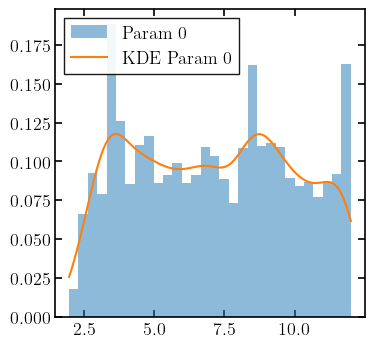

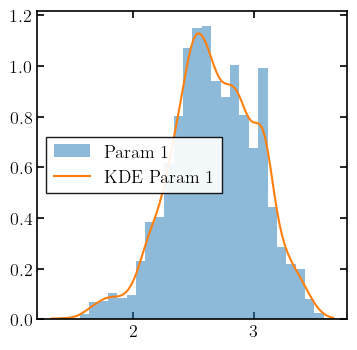

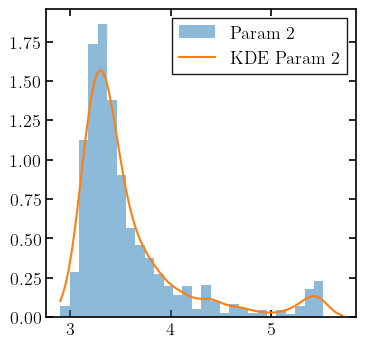

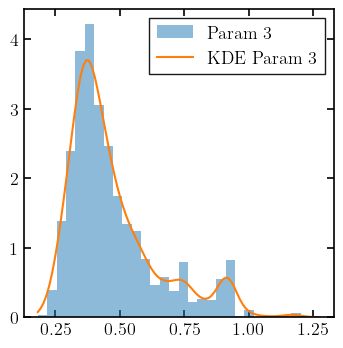

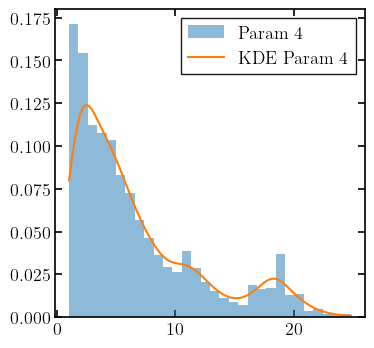

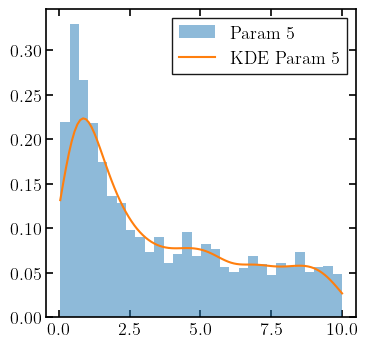

In [19]:
import emcee
import corner
from scipy import stats

test_backend    = baseline_paths["A5.0"]
samples         = emcee.backends.HDFBackend(test_backend).get_chain(flat=True, discard=3000, thin = 10)

#corner.corner(samples)
kernel = stats.gaussian_kde(samples.T, bw_method=0.2)
for i in range(samples.shape[1]):
    plt.subplots(figsize=(4, 4))
    plt.hist(samples[:, i], bins=30, density=True, alpha=0.5, label=f"Param {i}")
    x = np.linspace(samples[:, i].min(), samples[:, i].max(), 100)
    plt.plot(x, kernel.marginal(i).evaluate(x), label=f"KDE Param {i}")
    plt.legend()
    plt.show()

In [20]:
# Run configuration
geom_eff_func = geometric_efficiency_flat_midpoint

# Run the single complete MC chain for all alphas.
run_pop(
    baseline_paths  =   baseline_paths,
    alphas          =   possible_alpha,
    geom_eff_func   =   geom_eff_func,
    datafiles   =   datafiles,
    n_params    =   7, 
    n_walkers   =   24, 
    n_steps     =   30_000
)

Found existing backend for alpha=A0.5 at ../Output_files/baseline_flat_midpoint_alpha_A0.5/emcee.h5. 
Using redshift model: samples_fiducial_delayed_A0.5_BNSs_0.dat with 60187 BNSs.
Computed total merger rate: 60477.4 yr^-1 (local R_0 = 22.7 Gpc^-3 yr^-1) for component BNSs
Generating temporal interpolators... (this may take a moment)
Preparing catalogue with limits: {'F_LIM': 4, 'T90_LIM': 2, 'EP_LIM_UPPER': 10000, 'EP_LIM_LOWER': 50}
Triggered events: 325, Trigger years: 17.50, Yearly rate: 18.58 events/year
Computed total merger rate: 18332.3 yr^-1 (local R_0 = 3.8 Gpc^-3 yr^-1) for component BHNSs
NSBH population: fiducial_delayed_cut / A0.5
  BHNSs local rate R_0 = 3.8 Gpc^-3 yr^-1
  BHNSs total rate     = 18332 yr^-1
  1-year z sample size = 18332
Creating new directory : Output_files/midpoint_complete_alpha_A0.5
Running starting position (24, 7)
Starting new run from starting point


100%|██████████| 30000/30000 [1:19:13<00:00,  6.31it/s]


Found existing backend for alpha=A1.0 at ../Output_files/baseline_flat_midpoint_alpha_A1.0/emcee.h5. 
Using redshift model: samples_fiducial_delayed_A1.0_BNSs_0.dat with 342071 BNSs.
Computed total merger rate: 343741.1 yr^-1 (local R_0 = 107.4 Gpc^-3 yr^-1) for component BNSs
Generating temporal interpolators... (this may take a moment)
Preparing catalogue with limits: {'F_LIM': 4, 'T90_LIM': 2, 'EP_LIM_UPPER': 10000, 'EP_LIM_LOWER': 50}
Triggered events: 325, Trigger years: 17.50, Yearly rate: 18.58 events/year
Computed total merger rate: 11117.2 yr^-1 (local R_0 = 2.3 Gpc^-3 yr^-1) for component BHNSs
NSBH population: fiducial_delayed_cut / A1.0
  BHNSs local rate R_0 = 2.3 Gpc^-3 yr^-1
  BHNSs total rate     = 11117 yr^-1
  1-year z sample size = 11117
Creating new directory : Output_files/midpoint_complete_alpha_A1.0
Running starting position (24, 7)
Starting new run from starting point


100%|██████████| 30000/30000 [1:17:49<00:00,  6.42it/s]


Found existing backend for alpha=A3.0 at ../Output_files/baseline_flat_midpoint_alpha_A3.0/emcee.h5. 
Using redshift model: samples_fiducial_delayed_A3.0_BNSs_0.dat with 358417 BNSs.
Computed total merger rate: 360097.8 yr^-1 (local R_0 = 178.9 Gpc^-3 yr^-1) for component BNSs
Generating temporal interpolators... (this may take a moment)
Preparing catalogue with limits: {'F_LIM': 4, 'T90_LIM': 2, 'EP_LIM_UPPER': 10000, 'EP_LIM_LOWER': 50}
Triggered events: 325, Trigger years: 17.50, Yearly rate: 18.58 events/year
Computed total merger rate: 4936.9 yr^-1 (local R_0 = 1.2 Gpc^-3 yr^-1) for component BHNSs
NSBH population: fiducial_delayed_cut / A3.0
  BHNSs local rate R_0 = 1.2 Gpc^-3 yr^-1
  BHNSs total rate     = 4937 yr^-1
  1-year z sample size = 4936
Creating new directory : Output_files/midpoint_complete_alpha_A3.0
Running starting position (24, 7)
Starting new run from starting point


100%|██████████| 30000/30000 [1:16:28<00:00,  6.54it/s]


Found existing backend for alpha=A5.0 at ../Output_files/baseline_flat_midpoint_alpha_A5.0/emcee.h5. 
Using redshift model: samples_fiducial_delayed_A5.0_BNSs_0.dat with 136203 BNSs.
Computed total merger rate: 136874.3 yr^-1 (local R_0 = 127.8 Gpc^-3 yr^-1) for component BNSs
Generating temporal interpolators... (this may take a moment)
Preparing catalogue with limits: {'F_LIM': 4, 'T90_LIM': 2, 'EP_LIM_UPPER': 10000, 'EP_LIM_LOWER': 50}
Triggered events: 325, Trigger years: 17.50, Yearly rate: 18.58 events/year
Computed total merger rate: 4095.2 yr^-1 (local R_0 = 1.0 Gpc^-3 yr^-1) for component BHNSs
NSBH population: fiducial_delayed_cut / A5.0
  BHNSs local rate R_0 = 1.0 Gpc^-3 yr^-1
  BHNSs total rate     = 4095 yr^-1
  1-year z sample size = 4095
Creating new directory : Output_files/midpoint_complete_alpha_A5.0
Running starting position (24, 7)
Starting new run from starting point


100%|██████████| 30000/30000 [1:15:52<00:00,  6.59it/s]


Loading existing directory  : Output_files/midpoint_complete_alpha_A0.5


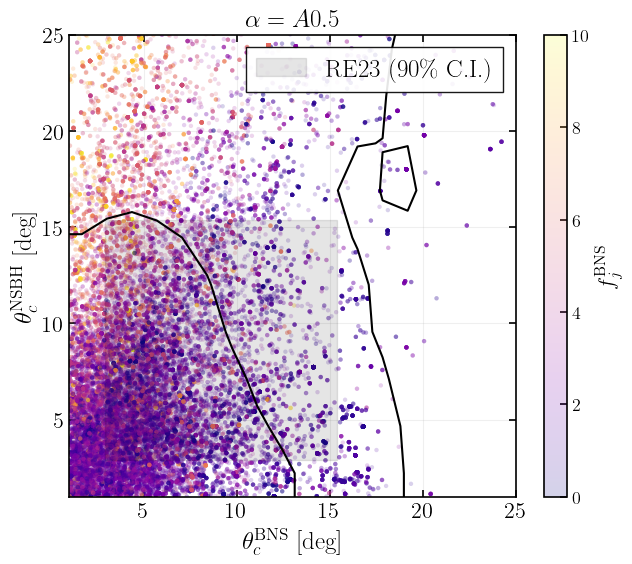

Loading existing directory  : Output_files/midpoint_complete_alpha_A1.0


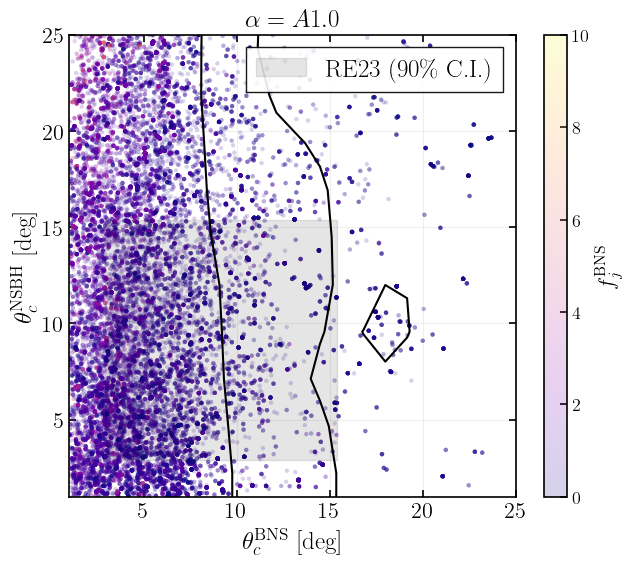

Loading existing directory  : Output_files/midpoint_complete_alpha_A3.0


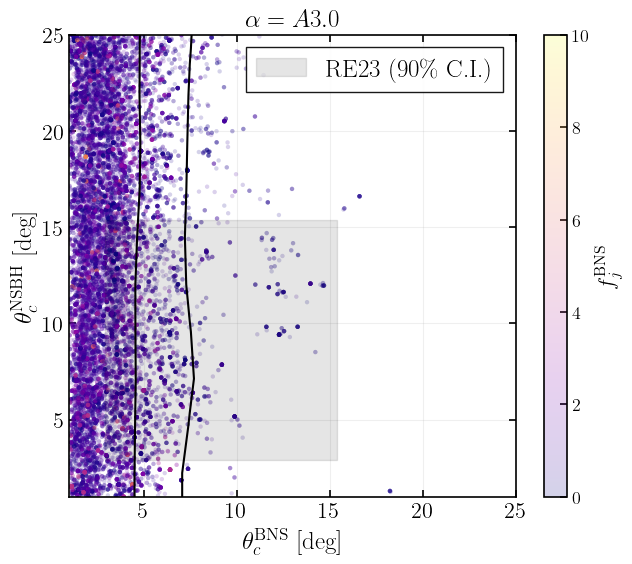

Loading existing directory  : Output_files/midpoint_complete_alpha_A5.0


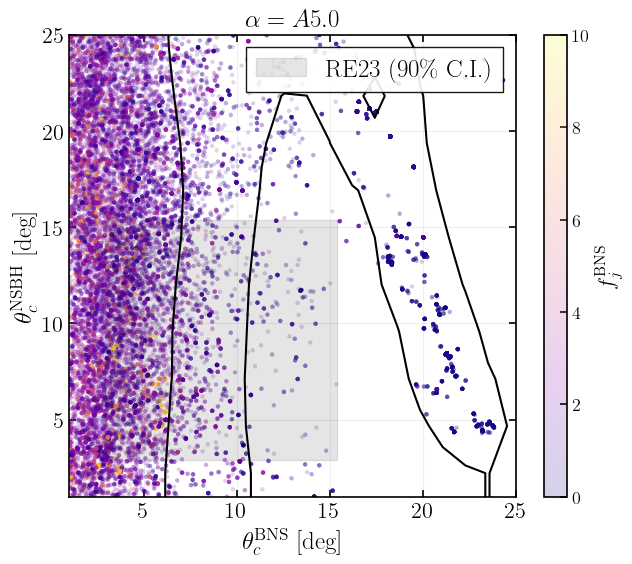

Loading existing directory  : Output_files/midpoint_complete_alpha_A0.5


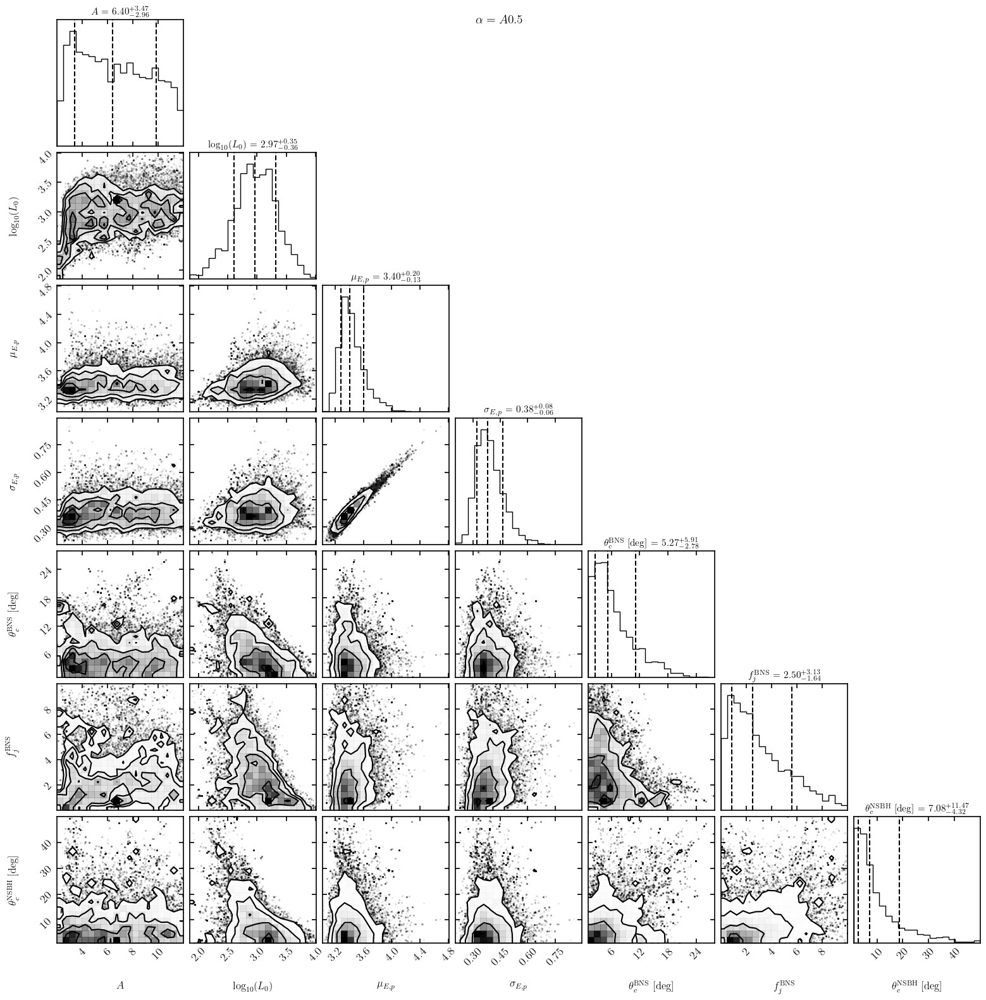

Loading existing directory  : Output_files/midpoint_complete_alpha_A1.0


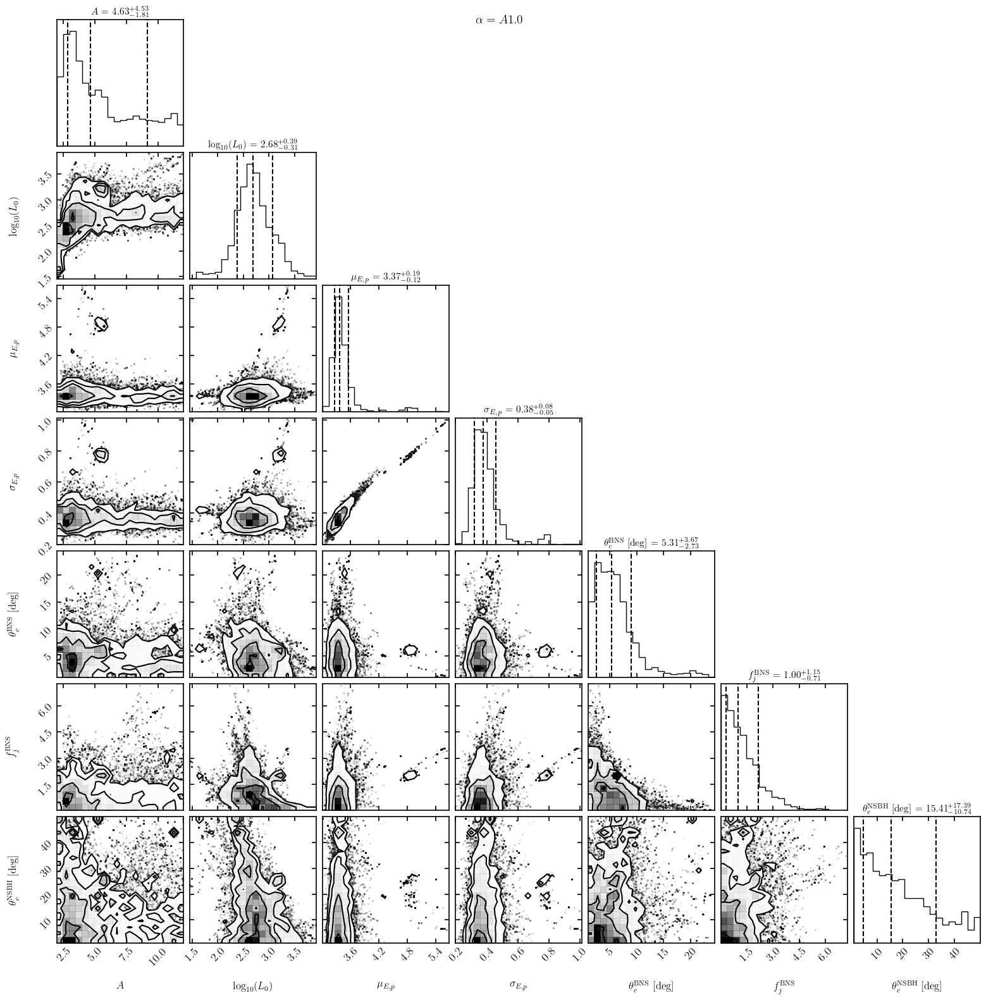

Loading existing directory  : Output_files/midpoint_complete_alpha_A3.0


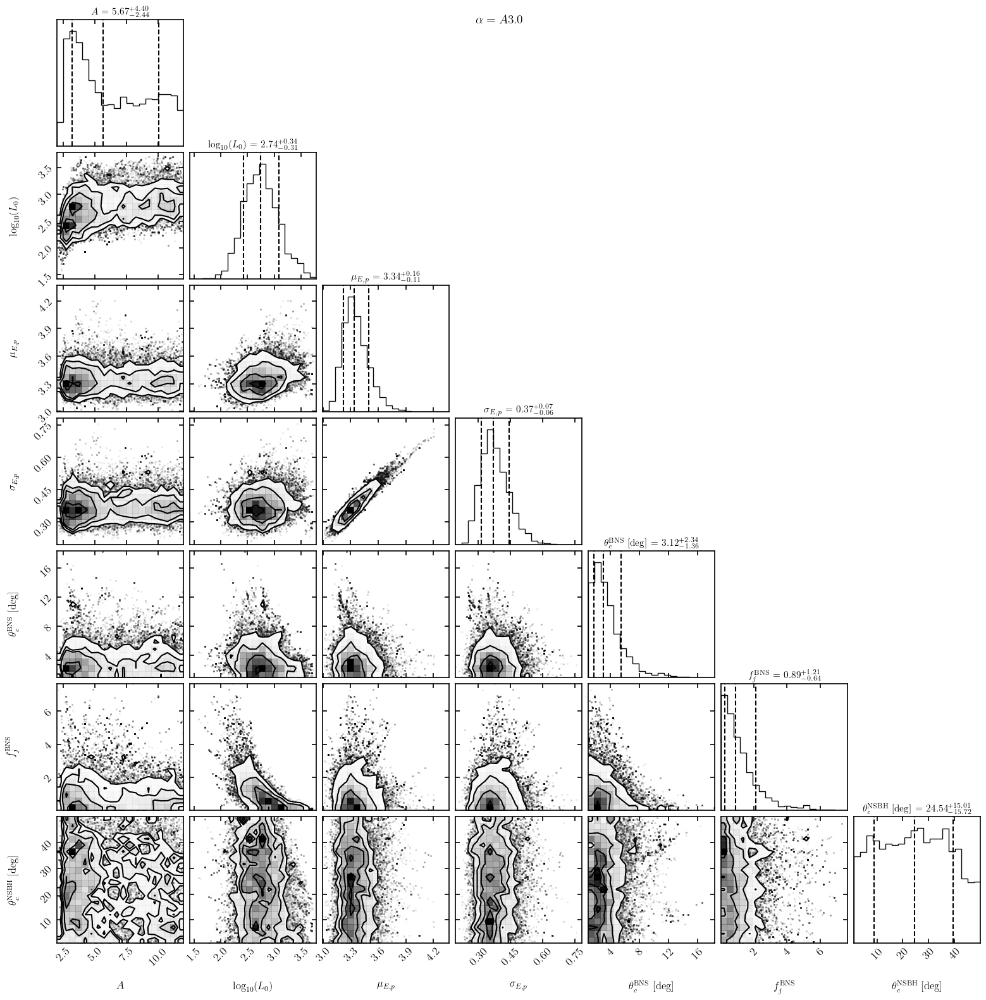

Loading existing directory  : Output_files/midpoint_complete_alpha_A5.0


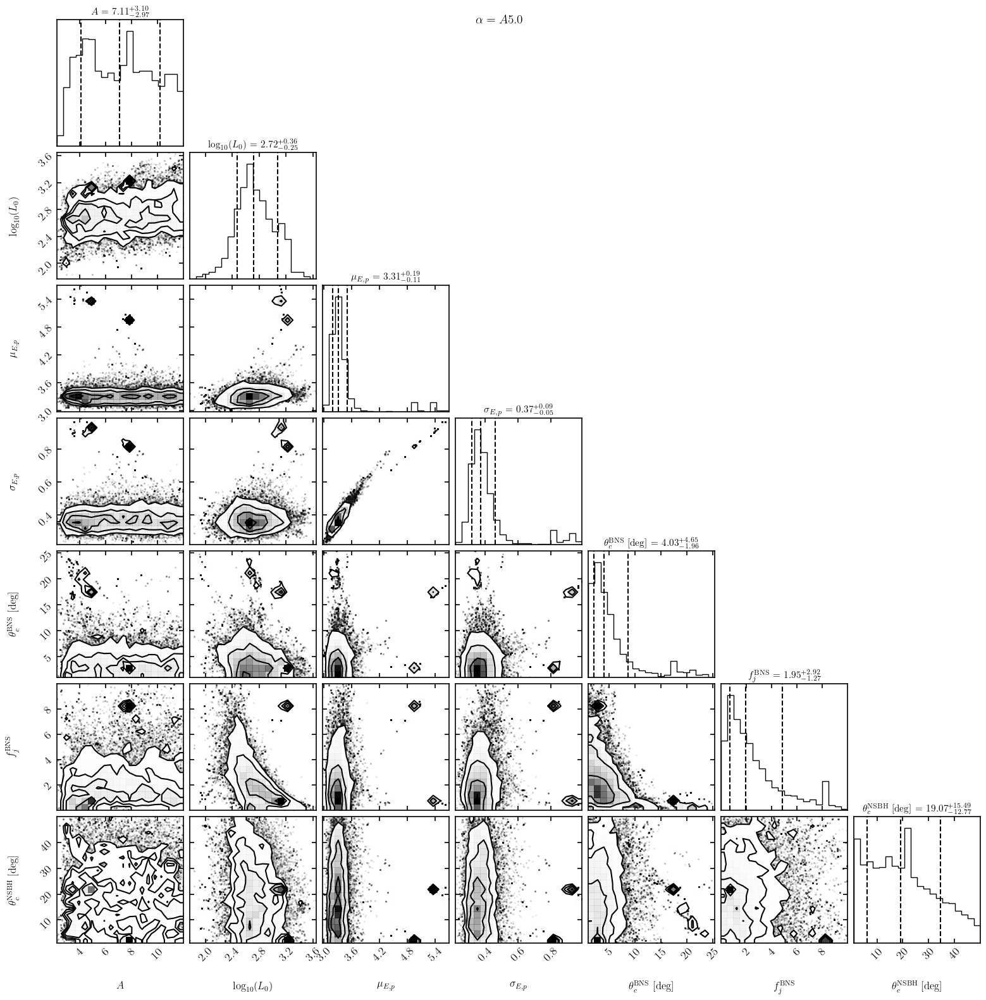

In [34]:
# Plot the combined results contours and corner plots
plot_populations(
    alphas=possible_alpha,
    burn_frac=0.33,
    thin=10,
)

plot_corner(
    alphas=possible_alpha,
    burn_frac=0.33,
    thin=10,
)

In [22]:
import emcee

# Diagnostic plots: fraction > 10 deg and NSBH relative contribution
theta_threshold     = 10.0
alpha_tests         = ["A0.5", "A1.0", "A3.0", "A5.0"]
half_width          = 6.0

theta_bins = np.linspace(1.0, 25.0, 6)
bin_size = theta_bins[1] - theta_bins[0]

Loading existing directory  : Output_files/midpoint_complete_alpha_A0.5


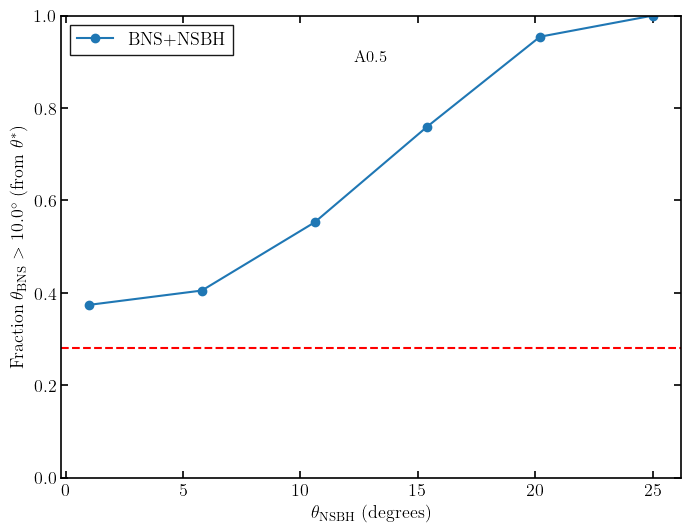

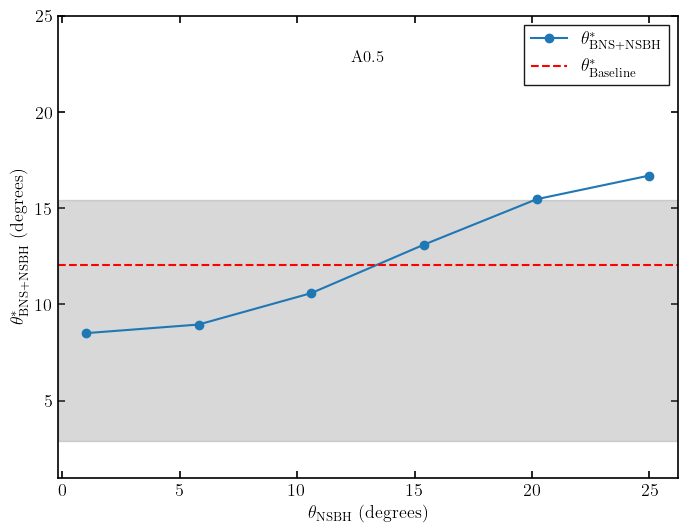

Loading existing directory  : Output_files/midpoint_complete_alpha_A1.0


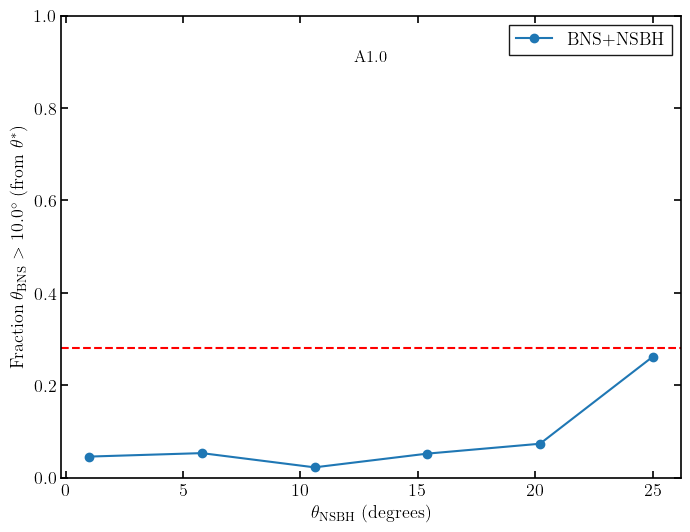

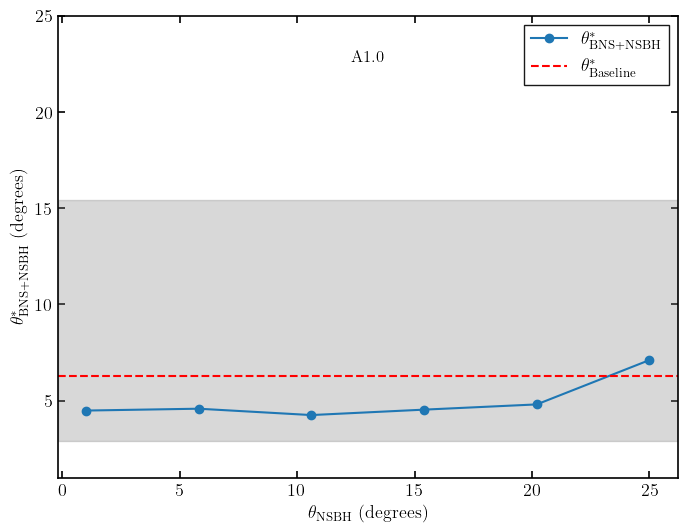

Loading existing directory  : Output_files/midpoint_complete_alpha_A3.0


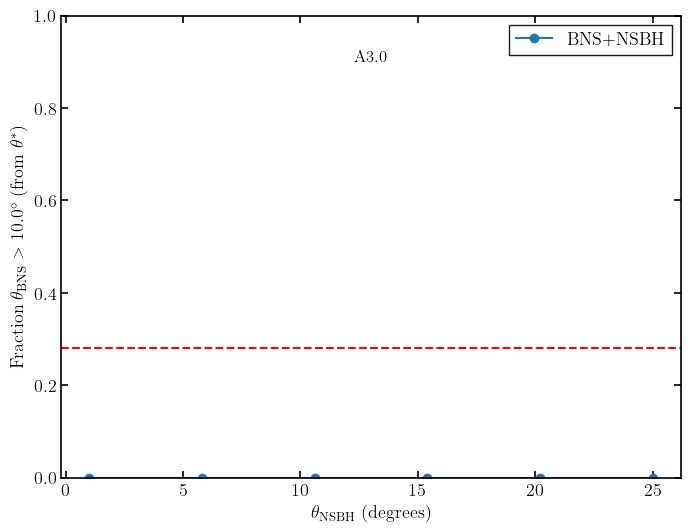

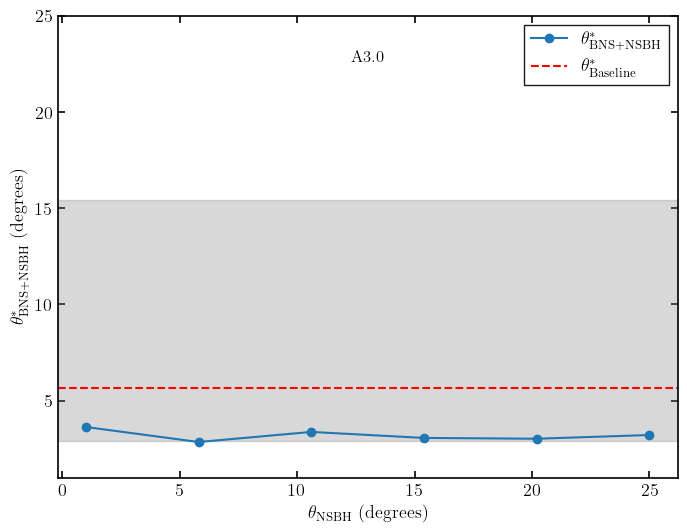

Loading existing directory  : Output_files/midpoint_complete_alpha_A5.0


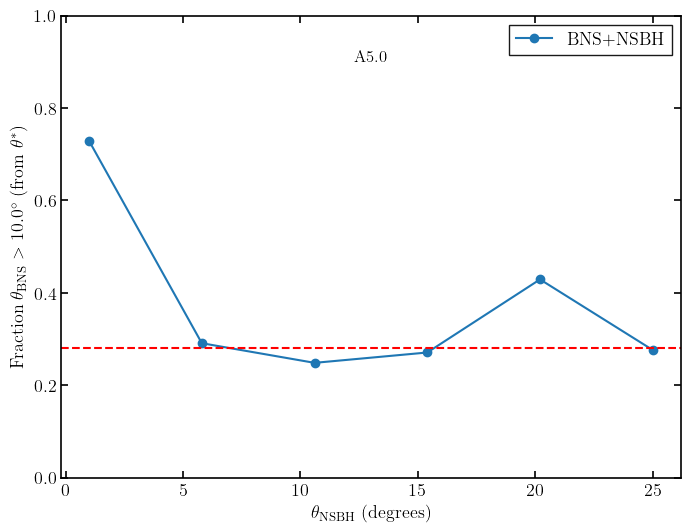

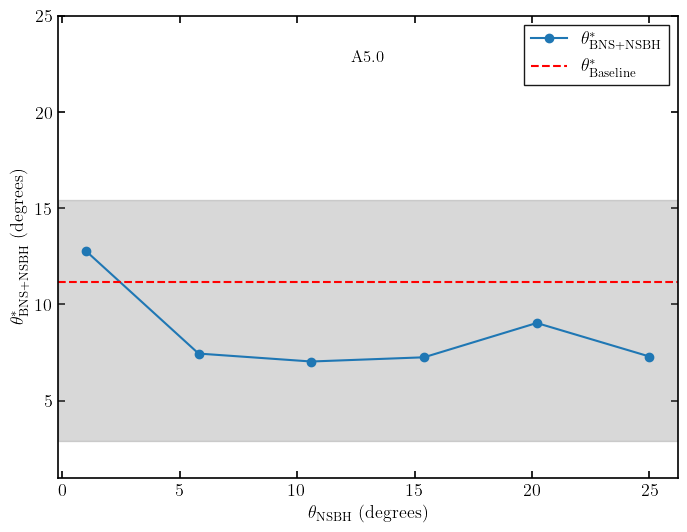

In [37]:
from scipy.stats import binned_statistic
from scipy.optimize import brentq

def calculate_theta_star_from_beaming(theta_samples, fj_samples, beaming_func, boundary_limit=9.0, n_bins=50):
    """
    Calculates theta* (where f_j = 1).
    """
    min_theta, max_theta = np.min(theta_samples), np.max(theta_samples)        
    bins = np.logspace(np.log10(min_theta), np.log10(max_theta), n_bins + 1)
    
    p95_per_bin, bin_edges, bin_indices = binned_statistic(
        theta_samples, fj_samples, 
        statistic=lambda y: np.percentile(y, 95), 
        bins=bins
    )
    
    valid_bin_indices = np.where(p95_per_bin < boundary_limit)[0] + 1
    if len(valid_bin_indices) == 0:
        return np.nan, np.nan, np.zeros(len(theta_samples), dtype=bool)

    valid_samples_mask = np.isin(bin_indices, valid_bin_indices)
    theta_valid = theta_samples[valid_samples_mask]
    fj_valid    = fj_samples[valid_samples_mask]

    beaming_vals = beaming_func(theta_valid)
    C_est        = np.median(fj_valid * beaming_vals)
    
    def objective(t):
        return beaming_func(t) - C_est
        
    lower, upper = 1.1, 45
    if hasattr(beaming_func, 'x'): 
        lower = max(lower, beaming_func.x[0])
        upper = min(upper, beaming_func.x[-1])

    theta_star = np.nan
    val_lower = objective(lower)
    val_upper = objective(upper)
    
    if np.isnan(val_lower) or np.isnan(val_upper):
        return np.nan, C_est, valid_samples_mask
    
    if val_lower * val_upper < 0:
        theta_star = brentq(objective, lower, upper)

    return theta_star, C_est, valid_samples_mask

def get_theta_star_complete(alpha, geom_eff_func):
    backend = emcee.backends.HDFBackend(_backend_path(alpha))
    samples = backend.get_chain(discard=3000, flat=True, thin=10)
    
    theta_bns_samples   = samples[:, 4]
    theta_nsbh_samples  = samples[:, 6]
    fj_samples          = samples[:, 5]
    
    theta_star_bns_nsbh = []
    for theta_nsbh_i in theta_bins:
        mask_low = theta_nsbh_samples > theta_nsbh_i - bin_size/2
        mask_high = theta_nsbh_samples < theta_nsbh_i + bin_size/2
        mask = mask_low & mask_high 
        
        fj_samples_nsbh_i           = fj_samples[mask]
        theta_bns_samples_nsbh_i    = theta_bns_samples[mask]
        
        if len(theta_bns_samples_nsbh_i) > 0:
            ts, _, _ = calculate_theta_star_from_beaming(theta_bns_samples_nsbh_i, fj_samples_nsbh_i, geom_eff_func)
        else:
            ts = np.nan
        theta_star_bns_nsbh.append(ts)

    return theta_star_bns_nsbh

from src.top_hat.geometric_eff import generate_theta_c_flat_midpoint

for alpha_val in alpha_tests:
    try:
        theta_s_bns_nsbh = get_theta_star_complete(alpha_val, geom_eff_func)
        n = 10_000
        frac_bns_nsbh =  [
            sum(generate_theta_c_flat_midpoint(ts, n_samples=n) > theta_threshold)/n for ts in theta_s_bns_nsbh
        ]
        #for alpha in possible_alpha:
        #    plot_prior_vs_posterior_1d(alpha)
        #baseline_path = baseline_paths.get(alpha)baseline_backend = emcee.backends.HDFBackend(baseline_path)
        #    baseline_samples = baseline_backend.get_chain(flat=True, discard=3000, thin=10)
        baseline_path = baseline_paths.get(alpha_val)
        baseline_backend = emcee.backends.HDFBackend(baseline_path)
        b_samples = baseline_backend.get_chain(flat=True, discard=3000, thin=10)
        theta_bns_samples   = b_samples[:, 4]
        fj_bns_samples    = b_samples[:, 5]
        theta_star_baseline = calculate_theta_star_from_beaming(theta_bns_samples, fj_bns_samples, geom_eff_func)[0]

        fig, ax = plt.subplots(figsize=(8, 6))
        ax.plot(theta_bins, frac_bns_nsbh, label='BNS+NSBH', marker='o')
        ax.text(0.5, 0.9, f'{alpha_val}', transform=ax.transAxes, fontsize=12, ha='center')
        ax.set_xlabel(r'$\theta_{\mathrm{NSBH}}$ (degrees)')
        ax.set_ylabel(rf'Fraction $\theta_{{\mathrm{{BNS}}}} > {theta_threshold}^\circ$ (from $\theta^*$)')
        ax.legend(loc='best')
        ax.axhline(0.28, color='red', linestyle='--')
        ax.set_ylim(0, 1)
        plt.show()

        #plot also the theta_star
        fig, ax = plt.subplots(figsize=(8, 6))
        ax.plot(theta_bins, theta_s_bns_nsbh, label=r'$\theta^*_{\mathrm{BNS+NSBH}}$', marker='o')
        ax.text(0.5, 0.9, f'{alpha_val}', transform=ax.transAxes, fontsize=12, ha='center')
        ax.axhline(theta_star_baseline, color='red', linestyle='--', label=r'$\theta^*_{\mathrm{Baseline}}$')
        ax.set_xlabel(r'$\theta_{\mathrm{NSBH}}$ (degrees)')
        ax.set_ylabel(r'$\theta^*_{\mathrm{BNS+NSBH}}$ (degrees)')
        ax.legend(loc='best')

        plt.axhspan(
            6.1-3.2, 6.1+9.3, color='gray', alpha=0.3, label='R23'
        )

        plt.ylim(1, 25)
        plt.show()

    except Exception as e:
        print(f"Skipping {alpha_val} for now: {e}")

Loading existing directory  : Output_files/midpoint_complete_alpha_A0.5
9188 39052


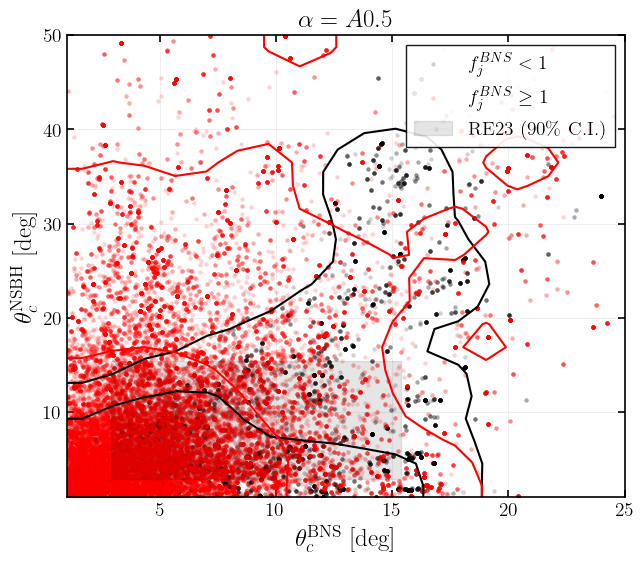

Loading existing directory  : Output_files/midpoint_complete_alpha_A1.0
24206 24034


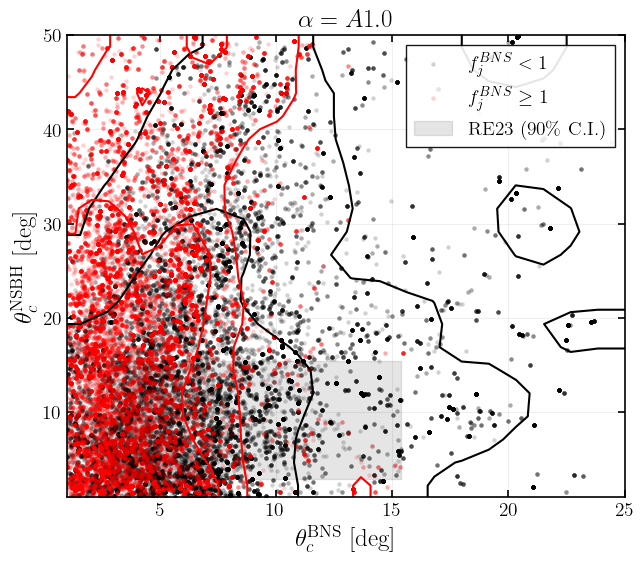

Loading existing directory  : Output_files/midpoint_complete_alpha_A3.0
26394 21846


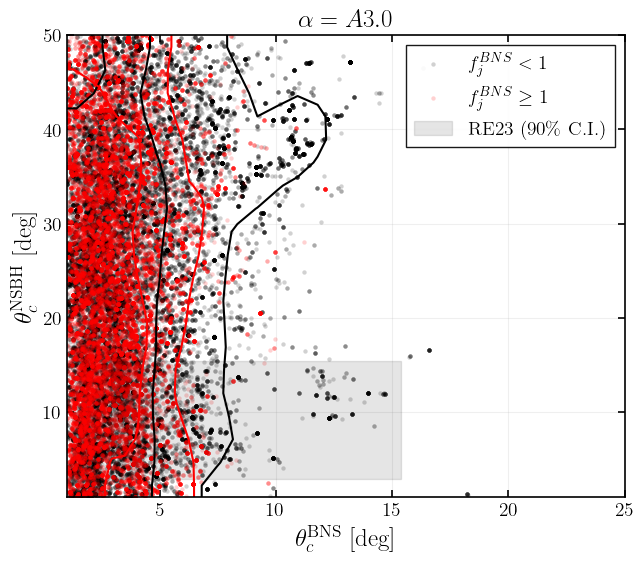

Loading existing directory  : Output_files/midpoint_complete_alpha_A5.0
12929 35311


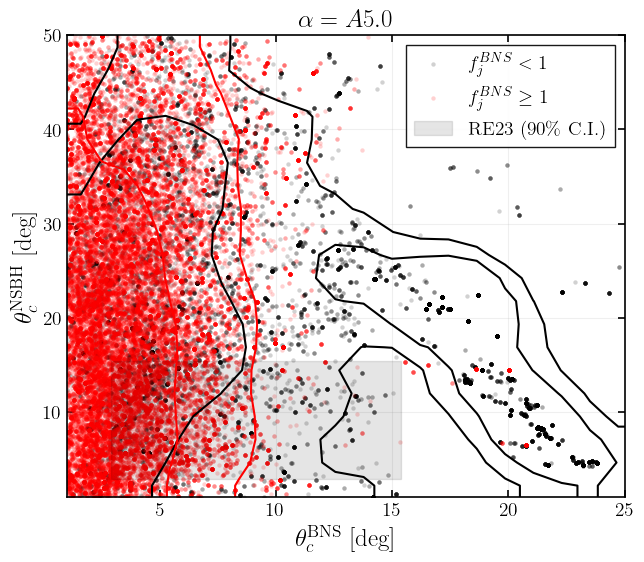

In [48]:
from mcmc_runner import plot_populations_splot, plot_populations_grid
plot_populations_splot(
    alphas=possible_alpha,
    burn_frac=0.33,
    thin=10,
)

## Prior vs Posterior 1D KDE overlays

The next cells compare the original backend samples against the updated posterior samples and mark the baseline theta* reference from the test paths.

Loading existing directory  : Output_files/midpoint_complete_alpha_A0.5
Loading existing directory  : Output_files/midpoint_complete_alpha_A1.0
Loading existing directory  : Output_files/midpoint_complete_alpha_A3.0
Loading existing directory  : Output_files/midpoint_complete_alpha_A5.0


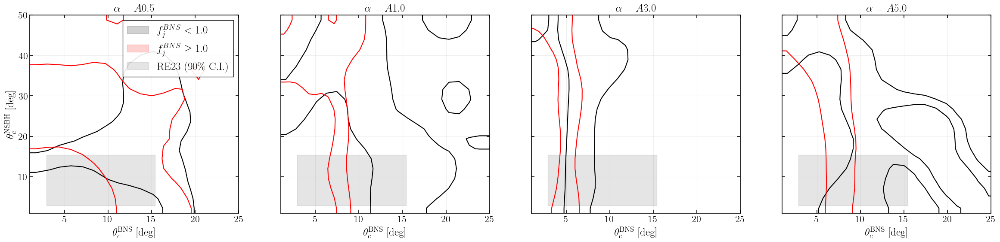

In [57]:
plot_populations_grid(
    alphas=possible_alpha,
    burn_frac=0.33,
    thin=10,
)

In [ ]:
import emcee
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from scipy.optimize import brentq
from scipy.stats import binned_statistic


def _theta_star_from_samples(theta_samples, fj_samples, beaming_func, boundary_limit=9.0, n_bins=50):
    min_theta, max_theta = np.min(theta_samples), np.max(theta_samples)
    bins = np.logspace(np.log10(min_theta), np.log10(max_theta), n_bins + 1)

    p95_per_bin, _, bin_indices = binned_statistic(
        theta_samples,
        fj_samples,
        statistic=lambda y: np.percentile(y, 95),
        bins=bins,
    )

    valid_bin_indices = np.where(p95_per_bin < boundary_limit)[0] + 1
    if len(valid_bin_indices) == 0:
        return np.nan

    valid_samples_mask = np.isin(bin_indices, valid_bin_indices)
    theta_valid = theta_samples[valid_samples_mask]
    fj_valid = fj_samples[valid_samples_mask]

    if len(theta_valid) == 0:
        return np.nan

    beaming_vals = beaming_func(theta_valid)
    C_est = np.median(fj_valid * beaming_vals)

    def objective(theta_value):
        return beaming_func(theta_value) - C_est

    lower, upper = 1.1, 45.0
    if hasattr(beaming_func, "x"):
        lower = max(lower, beaming_func.x[0])
        upper = min(upper, beaming_func.x[-1])

    val_lower = objective(lower)
    val_upper = objective(upper)
    if np.isnan(val_lower) or np.isnan(val_upper):
        return np.nan

    if val_lower * val_upper < 0:
        return brentq(objective, lower, upper)
    return np.nan


def _safe_kde_curve(samples, grid_points=300, bw_method=0.2):
    samples = np.asarray(samples)
    samples = samples[np.isfinite(samples)]
    if samples.size < 5 or np.allclose(samples, samples[0]):
        return None, None

    x_min = float(np.min(samples))
    x_max = float(np.max(samples))
    if not np.isfinite(x_min) or not np.isfinite(x_max) or x_min == x_max:
        return None, None

    x_grid = np.linspace(x_min, x_max, grid_points)
    kde = gaussian_kde(samples, bw_method=bw_method)
    return x_grid, kde(x_grid)


def plot_prior_vs_posterior_1d(alpha, burn_frac=0.33, thin=10):
    backend_path = _backend_path(alpha)
    if not backend_path.exists():
        print(f"Skipping {alpha}: posterior backend not found at {backend_path}")
        return

    baseline_path = baseline_paths.get(alpha)
    if baseline_path is None or not baseline_path.exists():
        print(f"Skipping {alpha}: baseline backend not found at {baseline_path}")
        return

    posterior_backend = emcee.backends.HDFBackend(backend_path)
    posterior_samples = posterior_backend.get_chain(
        discard=int(posterior_backend.iteration * burn_frac),
        thin=thin,
        flat=True,
    )

    baseline_backend = emcee.backends.HDFBackend(baseline_path)
    baseline_samples = baseline_backend.get_chain(flat=True, discard=3000, thin=10)

    param_specs = [
        (0, r"$A$"),
        (1, r"$\log_{10}(L_0)$"),
        (2, r"$\mu_{E,p}$"),
        (3, r"$\sigma_{E,p}$"),
        (4, r"$\theta_c^{\mathrm{BNS}}$ [deg]"),
        (5, r"$f_j^{\mathrm{BNS}}$"),
        (6, r"$\theta_c^{\mathrm{NSBH}}$ [deg]"),
    ]

    fig, axes = plt.subplots(2, 4, figsize=(18, 8))
    axes = axes.ravel()

    theta_star = _theta_star_from_samples(
        baseline_samples[:, 4],
        baseline_samples[:, 5],
        geom_eff_func,
    )

    for axis_index, (param_index, label) in enumerate(param_specs):
        axis = axes[axis_index]
        posterior_column = posterior_samples[:, param_index]
        x_post, y_post = _safe_kde_curve(posterior_column)
        if x_post is not None:
            axis.plot(x_post, y_post, color="tab:blue", lw=2.0, label="Posterior")

        if param_index < baseline_samples.shape[1]:
            baseline_column = baseline_samples[:, param_index]
            x_base, y_base = _safe_kde_curve(baseline_column)
            if x_base is not None:
                axis.plot(
                    x_base,
                    y_base,
                    color="tab:orange",
                    lw=2.0,
                    ls="--",
                    label="Prior",
                )

        if param_index == 4 and np.isfinite(theta_star):
            axis.axvline(
                theta_star,
                color="k",
                lw=1.8,
                ls=":",
                label=rf"Baseline $\theta^* = {theta_star:.2f}^\circ$",
            )

        axis.set_title(label)
        axis.set_ylabel("Density")
        axis.grid(alpha=0.2)
        axis.legend(fontsize=9)

    for axis_index in range(len(param_specs), len(axes)):
        axes[axis_index].axis("off")

    fig.suptitle(f"Posterior vs baseline KDEs for alpha = {alpha}", fontsize=15)
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


Loading existing directory  : Output_files/midpoint_complete_alpha_A0.5


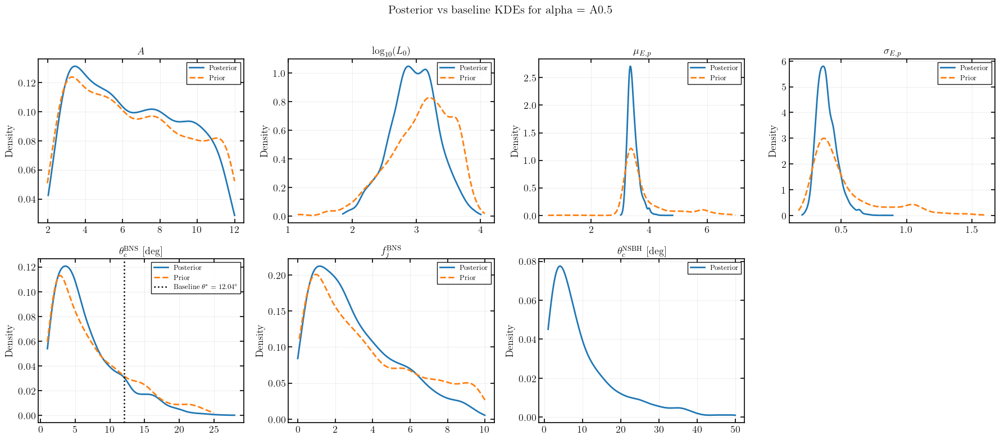

Loading existing directory  : Output_files/midpoint_complete_alpha_A1.0


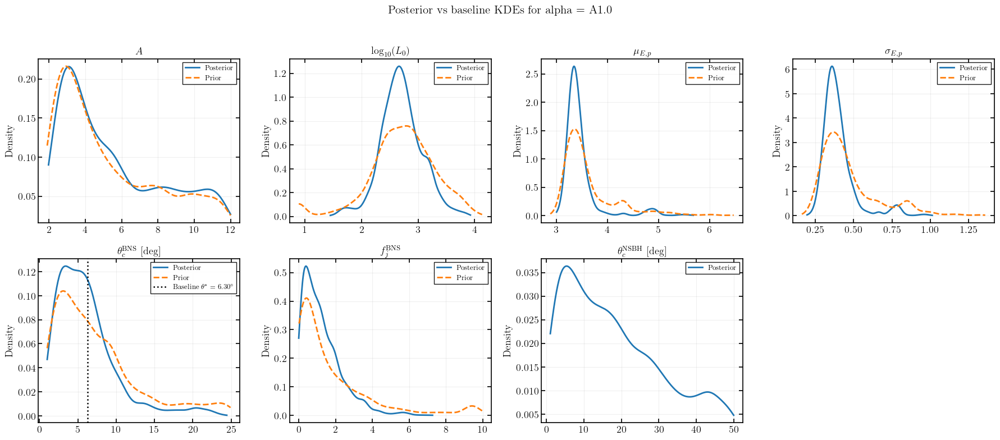

Loading existing directory  : Output_files/midpoint_complete_alpha_A3.0


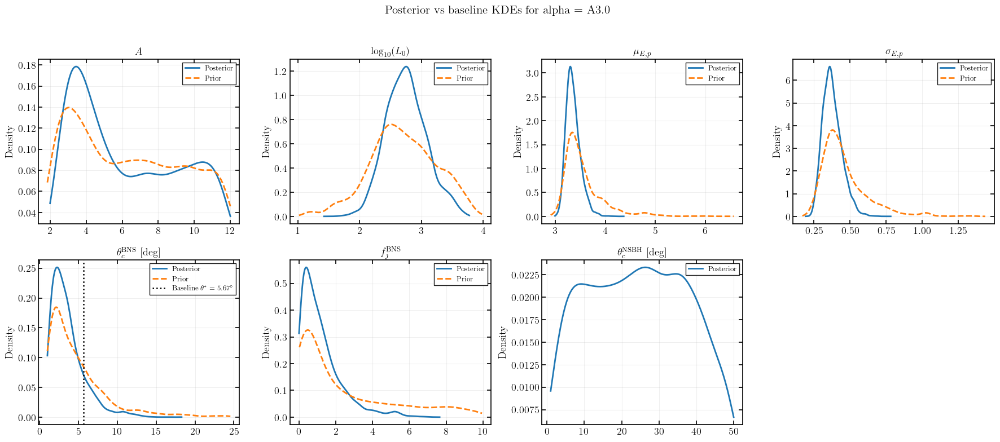

Loading existing directory  : Output_files/midpoint_complete_alpha_A5.0


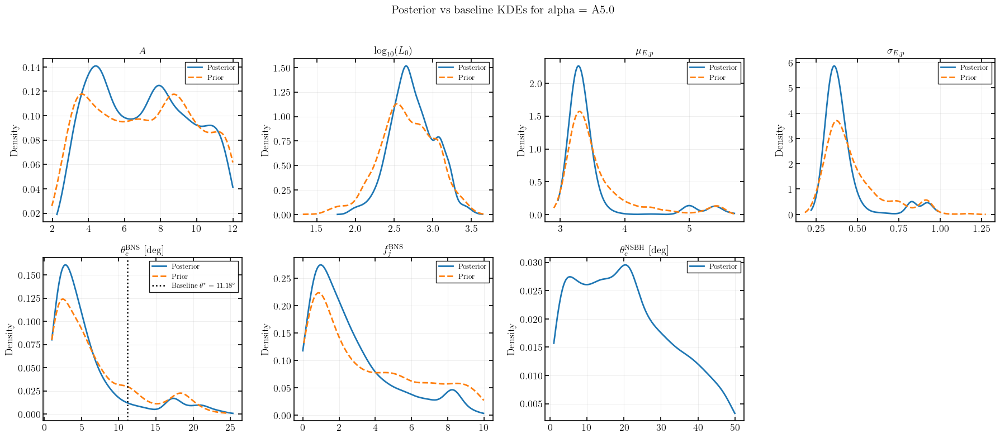

In [ ]:
for alpha in possible_alpha:
    plot_prior_vs_posterior_1d(alpha)


Loading existing directory  : Output_files/midpoint_complete_alpha_A0.5


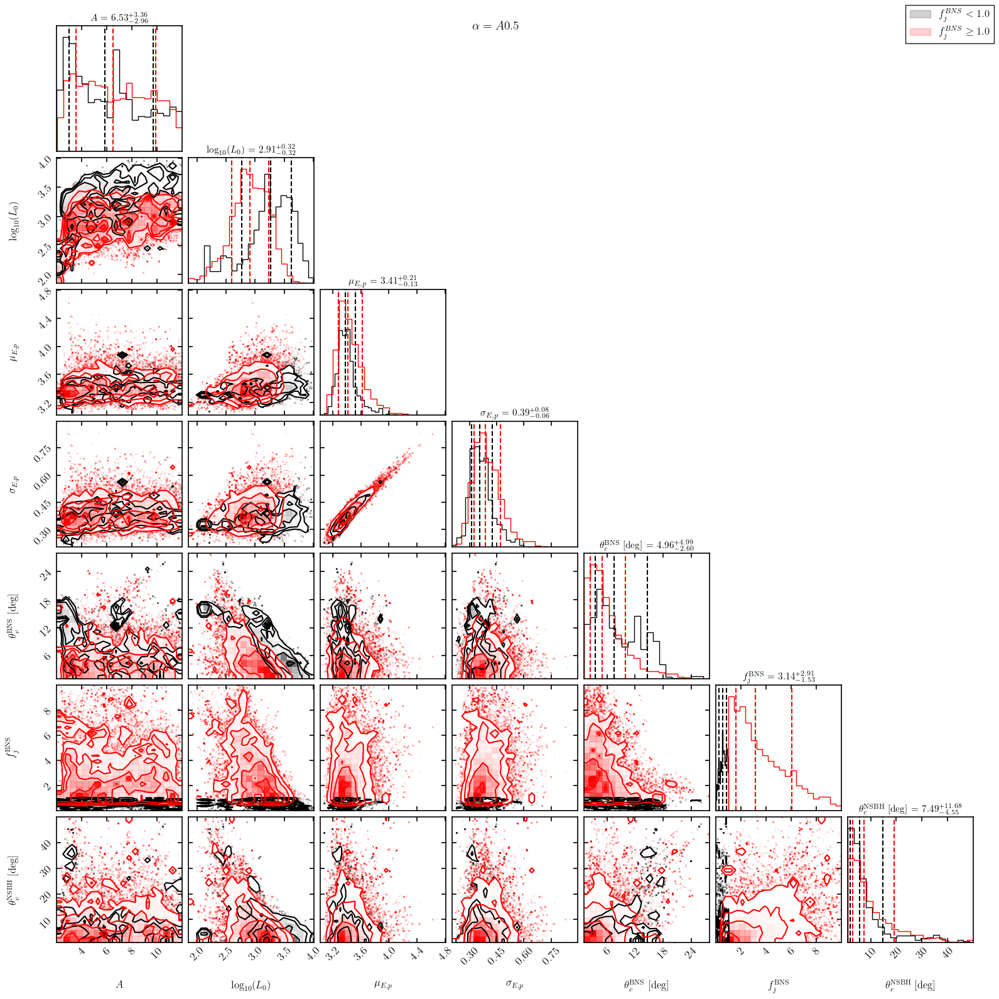

Loading existing directory  : Output_files/midpoint_complete_alpha_A1.0


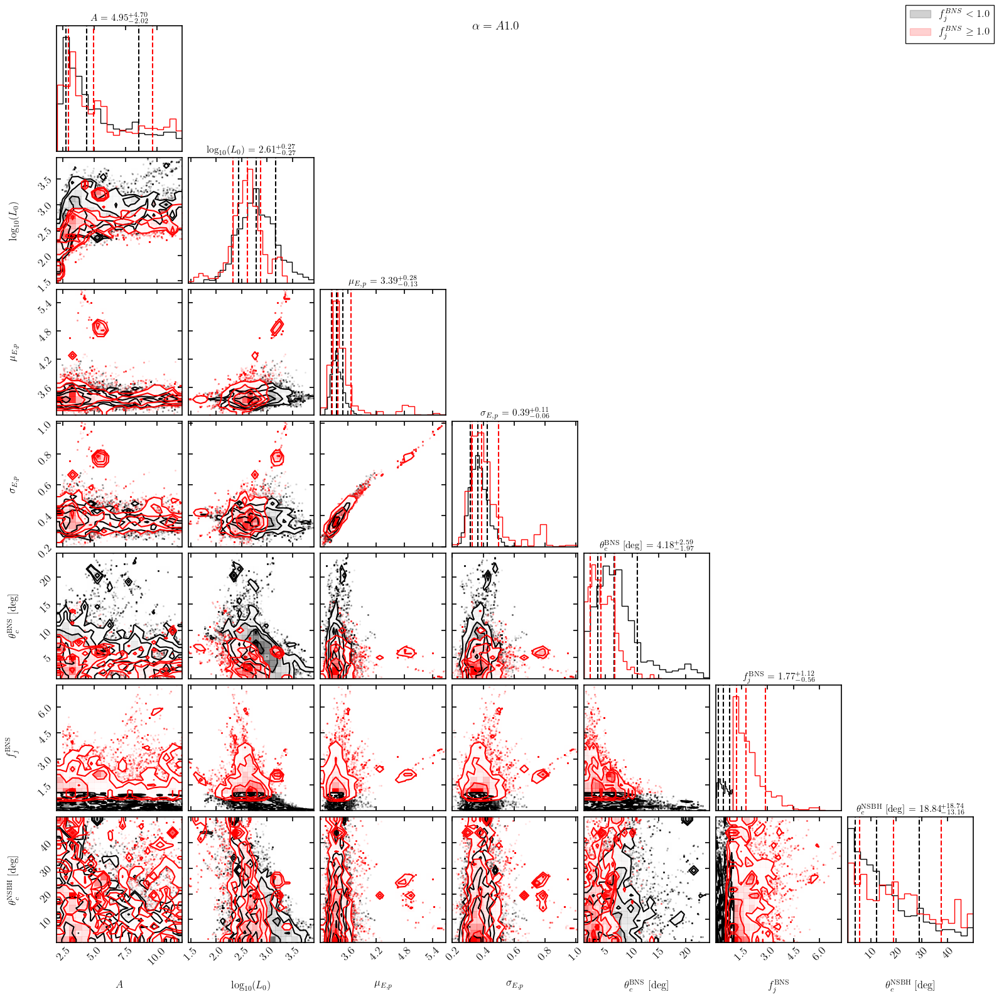

Loading existing directory  : Output_files/midpoint_complete_alpha_A3.0


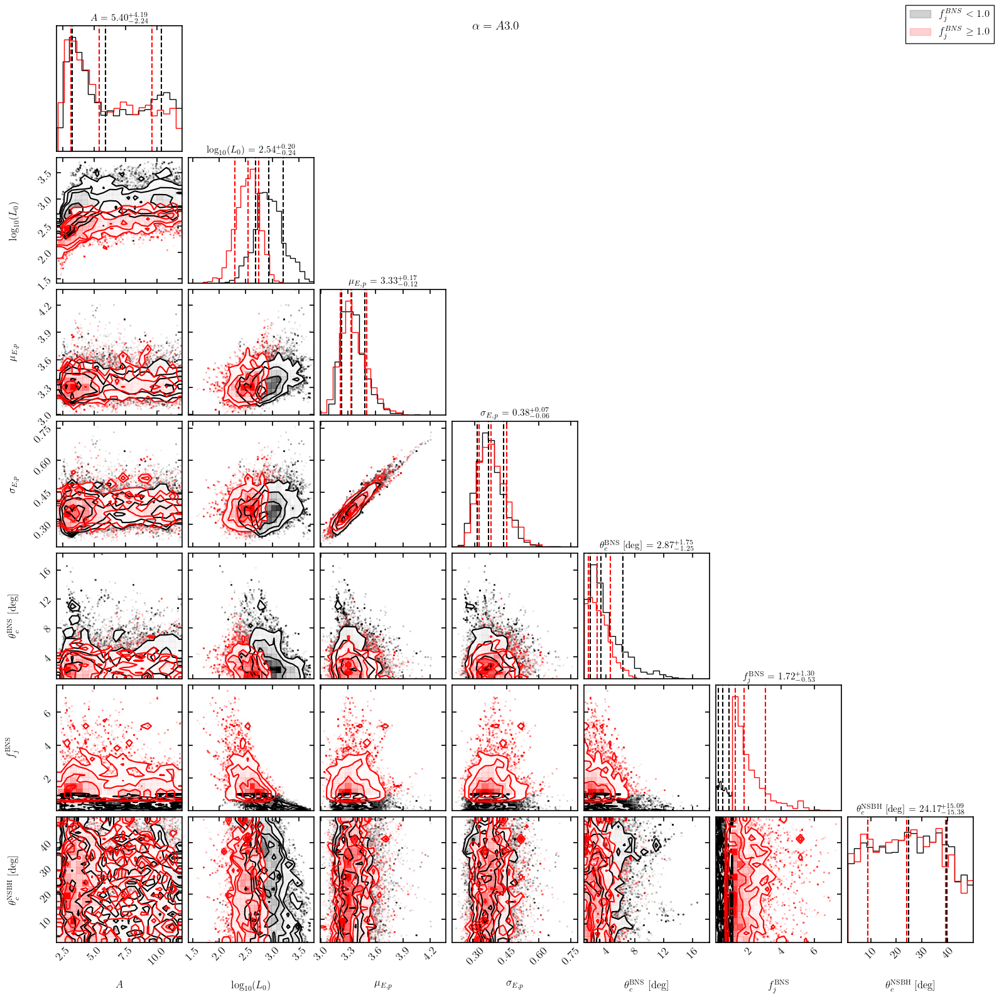

Loading existing directory  : Output_files/midpoint_complete_alpha_A5.0


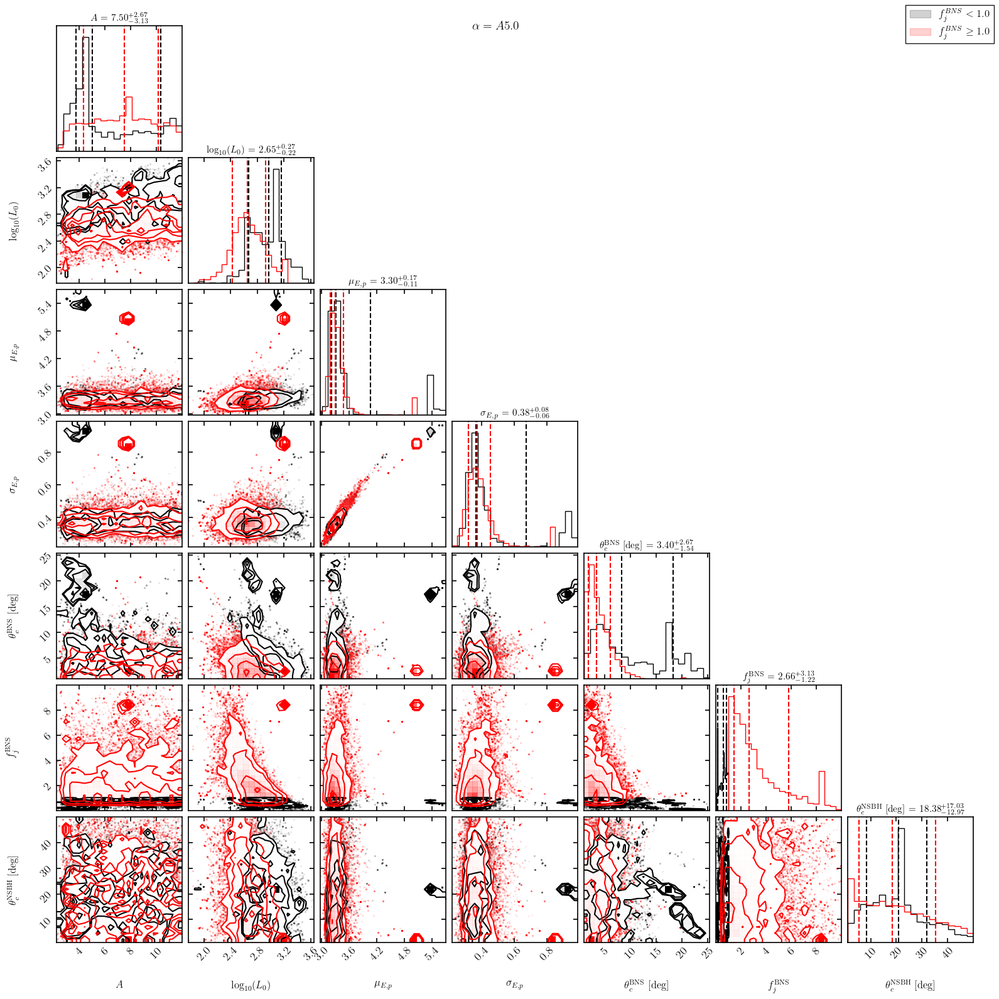

In [59]:
from mcmc_runner import plot_corner_cut

plot_corner_cut(
    alphas=possible_alpha,
    burn_frac=0.33,
    thin=10,
)